#  Data prepartion

## On-sale data

In [41]:

import pandas as pd
import numpy as np
import re

Area_5000_5150 = pd.read_csv("data_selling_no_rep5000_5150_19042023.csv",encoding = 'unicode_escape', engine ='python')
#Area_5085_5086 = pd.read_excel("5085-5086.xlsx")

print("shape: ",Area_5000_5150.shape,'\n')
pd.set_option('display.max_rows', 100)
print("Columns of Data: ",Area_5000_5150.columns,'\n')
Subset_5000_5150 = Area_5000_5150[['address','area', 'baths', 'beds', 'parking','date', 'price',
       'property_type', 'agent_name', 'school_list','agent_low_price', 
       'village_name', 'number']].copy()
print("number of NAs in each column: \n",Subset_5000_5150.isna().sum(),'\n')
print("Numbers of duplicated: ",Subset_5000_5150.duplicated().sum())

shape:  (2735, 21) 

Columns of Data:  Index(['area', 'baths', 'beds', 'parking', 'date', 'main_img', 'price',
       'address', 'property_type', 'agent_name', 'company_name', 'logo',
       'maps', 'check_date', 'auction_date', 'school_list', 'url',
       'village_name', 'DOMAINSAYS', 'number', 'agent_low_price'],
      dtype='object') 

number of NAs in each column: 
 address              0
area               678
baths              116
beds               117
parking            114
date                14
price                0
property_type        0
agent_name         228
school_list          0
agent_low_price      0
village_name         0
number               0
dtype: int64 

Numbers of duplicated:  0


Cleaning on-sale data

In [42]:
for i in Subset_5000_5150.index:
    
    
    item = Subset_5000_5150.loc[i,"price"]
    item = item.lower()
    item = item.replace(",","")
    item = item.replace("k","000")
    item = item.replace("*","")
    pattern_price = r"\$\d+[.]{0,1}[1-9]{0,3}\s?[m]?"
    #pattern_time = r"\s?[0:9]{1,2}[am|AM|pm|PM]"
    word = re.findall(pattern_price,item)
    #time = re.findall(pattern_time,item)
    result = []

    try:
        for num in word:
            num = num.replace("$","")
            nun = num.replace(" ","")
            if "." in num and "m" in num:
                doc_index = num.index(".") + 1
                num = num.replace("m","")
                num_len = len(num)
                num = num.replace(".","")
                num = float(num) * 10**(6-(num_len-doc_index))
                nun = num * 100000
            elif "." not in num and "m" in num:
                num = num.replace("m","")
                num = float(num)
                num = num * 1000000
            num = float(num)
            result.append(num)
        if len(result) == 2:
            final = (result[0] + result[1])/2
        else:
            final = result[0]
    except:
        final = np.nan

    Subset_5000_5150.loc[i,'clean_price'] = final

Subset_5000_5150.loc[580,'clean_price'] = 419000
Subset_5000_5150.loc[1345,'clean_price'] =594990
Subset_5000_5150.loc[2008,'clean_price'] = 820000
Subset_5000_5150.loc[2045,'clean_price'] = 834500
Subset_5000_5150.loc[2058,'clean_price'] = 840000
Subset_5000_5150.loc[2372,'clean_price'] = 1150000
Subset_5000_5150.loc[2385,'clean_price'] = 1050000
Subset_5000_5150.loc[2460,'clean_price'] = 1150000
Subset_5000_5150.loc[2522,'clean_price'] = 1325000
Subset_5000_5150.loc[2185,'clean_price'] = 925000
Subset_5000_5150.loc[2177,'clean_price'] = 925000
Subset_5000_5150.loc[2177,'clean_price'] = 790000


for i in Subset_5000_5150.index:
    if pd.isnull(Subset_5000_5150.loc[i,'clean_price']):
        pattern = r"[0-9]{4,}[k]?"
        item = Subset_5000_5150.loc[i,"price"]
        item = item.replace(",","")
        word = re.findall(pattern,item)
        result = np.nan
        if word:
            if len(word) == 2:
                result = (float(word[0]) + float(word[1])) /2
            else:
                result = float(word[0])

        if result != float(2023):
            Subset_5000_5150.loc[i,'clean_price'] = result

Subset_5000_5150.loc[1727,'clean_price'] = 685000

Subset_5000_5150['price_k'] = Subset_5000_5150['clean_price']/1000

Subset_5000_5150 = Subset_5000_5150[Subset_5000_5150["price_k"] > 1]

Subset_5000_5150["area"] = Subset_5000_5150["area"].replace(",","").replace()

area_price = Subset_5000_5150.copy()
area_price.head(50)
pattern = r"[0-9]{2,}"
for i in area_price.index:
    area = area_price.loc[i,"area"]
    if not pd.isna(area):
        square = re.findall(pattern,area)
        area_price.loc[i,"area"] = float(square[0])
    # else:
    #     area_price.loc[i,"area"] = np.nan
pd.isna(area_price.loc[1]) 
area_price.loc[463,"area"] = 1000
area_price.loc[1556,"area"] = 2000
area_price.loc[1869,"area"] = 1000
area_price.loc[2240,"area"] = 2000
area_price.loc[2301,"area"] = 5000

area_price.head(50)
area_price[area_price["area"] ==0]
area_price["price_per_m^2"] = area_price["price_k"] / area_price["area"]

area_price.to_csv("Subset_5000_5150.csv")




## Historical sold-data

Intergate all of the data set

In [43]:
h_5070 = pd.read_csv("C:/Users/iamUl/Desktop/intern/data/data-analysis-main/Data/Sold Data/all/5070.csv")
list_ = [5072,5073,5074,5075,5085,5086,5087,5088]
historical = h_5070.copy()
for i in list_:
    path = "C:/Users/iamUl/Desktop/intern/data/data-analysis-main/Data/Sold Data/all/" + str(i) + ".csv"
    temp_data_fram = pd.read_csv(path)
    historical  = historical.append(temp_data_fram)
historical = historical.reset_index(drop=True)
historical.shape

C:\Users\iamUl\AppData\Local\Temp\ipykernel_32848\537156435.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  historical  = historical.append(temp_data_fram)
C:\Users\iamUl\AppData\Local\Temp\ipykernel_32848\537156435.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  historical  = historical.append(temp_data_fram)
C:\Users\iamUl\AppData\Local\Temp\ipykernel_32848\537156435.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  historical  = historical.append(temp_data_fram)
C:\Users\iamUl\AppData\Local\Temp\ipykernel_32848\537156435.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  historical  = historical.append(temp_data_fram)
C:\U

(8620, 20)

Cleaning the data

In [44]:
#Cleaning area column
import re
import datetime as dt
pattern = r"[0-9]{2,}"
#pattern = r"m²"
#historical['area'] = historical['area'].replace(",","")
for i in historical.index: 
    string = historical.loc[i,"area"]
    string = str(string).replace(",","")
    if not pd.isna(string):
        #result = re.sub(pattern, "",string)
        result = re.findall(pattern,string)
        if result:
            #result = str(result).replace(",","")
            historical.loc[i,"area"] = float(result[0])

# Cleaning the date colum

pattern = r"[0-9]{1,2}\s\w{3}\s[0-9]{4}"
#historical['area'] = historical['area'].replace(",","")
for i in historical.index: 
    string = historical.loc[i,"date"]
    if not pd.isna(string):
        #result = re.sub(pattern, "",string)
        result = re.findall(pattern,string)
        if result:
            #result = str(result).replace(",","")
            result[0] = result[0].replace(" ","-")
            historical.loc[i,"date"] = result[0]

historical["date"] = pd.to_datetime(historical["date"])
historical["year"] = historical["date"].dt.year
historical["month"] = historical["date"].dt.month


# Cleaning the price colum
pattern = r"[0-9]+"

for i in historical.index:
    tem = historical.loc[i,"price"].replace(",","")
    if not pd.isna(tem):
        match = re.findall(pattern,tem)
        if match:
            historical.loc[i,"price"] = float(match[0])
        else:
            historical.loc[i,"price"] = np.nan


    
historical = historical[['area', 'baths', 'beds', 'parking', 'date', 'price',
       'address', 'property_type', 'agent_name', 'company_name',
       'maps',  'suburb',
       'DOMAINSAYS', 'postcode', 'year', 'month']]

historical["week"] = historical["date"].dt.week

historical.to_csv("historical.csv")

C:\Users\iamUl\AppData\Local\Temp\ipykernel_32848\3510468419.py:55: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.
  historical["week"] = historical["date"].dt.week


## EDA

Average building cost & average land price

To analysis, the following presumption be considered:
- Area above 700 m^2 considered as a vancant land, will use to calculate the average land price.
- Area between 100m^2 and 400 m^2 considered as a house, will use to calculate the average building cost.
- Under 100m^2 as apartment

In [45]:
historical.head(5)
historical = historical.loc[(historical["area"] > 0) & (historical["price"] > 0)]
historical["price_m^2"] = round((historical["price"]/historical["area"]).astype(float),2) 
historical["land/house"] = np.nan
historical.loc[historical["area"] >= 700,"land/house"] = "land"
historical.loc[(historical["area"] <= 400) & (historical["area"] > 100),"land/house"] = "house"
historical.loc[(historical["area"] <= 100)  ,"land/house"] = "apartment"
historical.loc[(historical["area"] < 700) & (historical["area"] > 400),"land/house"] = "between"

historical.head(5)

,area,baths,beds,parking,date,price,address,property_type,agent_name,company_name,maps,suburb,DOMAINSAYS,postcode,year,month,week,price_m^2,land/house
1,163.0,1.0,2.0,1,2020-03-04,328000.0,21/74-86 Marian Road Payneham SA 5070,NaN,NaN,Harcourts Sheppard,"-34.9012047,138.6473072",PAYNEHAM,"21/74-86 Marian Road, Payneham SA 5070 was las...",5070,2020,3,10,2012.27,house
6,750.0,2.0,5.0,2,2019-11-08,1625000.0,48 Ninth Avenue Joslin SA 5070,NaN,Sally Cameron,TOOP+TOOP Real Estate,"-34.8986271,138.6224943",JOSLIN,"48 Ninth Avenue, Joslin SA 5070 was last sold ...",5070,2019,11,45,2166.67,land
9,452.0,2.0,4.0,2,2020-07-02,701000.0,38a Laver Terrace Felixstow SA 5070,NaN,Tom Hector,Harris Real Estate - RLA 226409,"-34.8867959,138.6523224",FELIXSTOW,"38a Laver Terrace, Felixstow SA 5070 was last ...",5070,2020,7,27,1550.88,between
10,1420.0,1.0,4.0,5,2020-07-05,770000.0,46 Avenue Road Glynde SA 5070,NaN,Stephen Ong,Sinova Property,"-34.8975742,138.6486916",GLYNDE,"46 Avenue Road, Glynde SA 5070 was last sold i...",5070,2020,7,27,542.25,land
11,315.0,1.0,2.0,2,2020-12-17,498000.0,2/22 Second Avenue Payneham South SA 5070,NaN,Simon & Bec Tanner,Tanner Real Estate,"-34.9029656,138.6450929",PAYNEHAM SOUTH,"2/22 Second Avenue, Payneham South SA 5070 was...",5070,2020,12,51,1580.95,house


In [46]:
import matplotlib.pyplot as plt

def histogram(column,bins = 8,data = historical):
    """
    
    """
    plt.hist(data[column], bins=bins)  # Specify the data and the number of bins

    # Add labels and title
    plt.xlabel(column)
    plt.ylabel('Frequency')
    title = f"Frequency Of {column.title()}"
    plt.title(title)

    # Display the histogram
    plt.show()

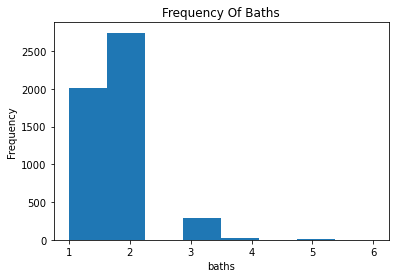

In [47]:

bath_plot = histogram("baths")
bath_plot

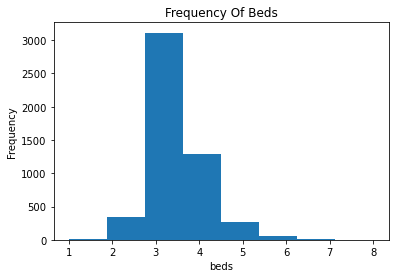

In [48]:
beds_plot = histogram("beds")
beds_plot

In [49]:
for i in historical.index:
    tem = historical.loc[i,"parking"]
    try:
        tem = int(tem)
        historical.loc[i,"parking"] = tem
    except:
        historical.loc[i,"parking"] = np.nan

d:\ProgramData\Anaconda3\lib\site-packages\numpy\lib\histograms.py:837: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
d:\ProgramData\Anaconda3\lib\site-packages\numpy\lib\histograms.py:838: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


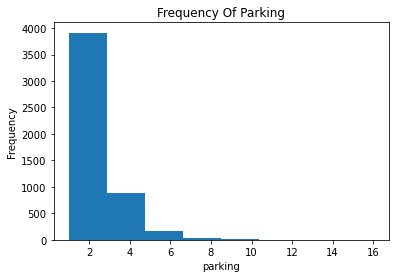

In [50]:
park_plot = histogram("parking")
park_plot

Trasform a new column which contans the type of property,eg 3b2b, which means 3 bedroom and 2 baths

In [51]:

room_type = historical.loc[historical["land/house"] == "house"]
room_type
pattern = r"[0-9]{1}"
for i in historical.index:
    tem = ""
    bed = re.findall(pattern,str(historical.loc[i,"beds"]))
    bath = re.findall(pattern,str(historical.loc[i,"baths"]))
    #park = re.findall(pattern,str(historical.loc[i,"parking"]))
    if bed:
        tem += str(bed[0]) + "b"
    if bath:
        tem += str(bath[0]) + "b"
    # if park:
    #     tem += str(park[0]) + "p"
    if tem:
        historical.loc[i,"property_type"] = tem
    else:
        historical.loc[i,"property_type"] = np.nan

#historical.loc[historical["property_type"] == "[]b[]b[]p"] = np.nan


In [52]:
cat_cols = ["postcode","year","month","week"]

for col in cat_cols:
   
    historical[col] = historical[col].astype("int")


num_cols = ["area","price"]

for col in num_cols:
    
    historical[col] = historical[col].astype("float")

print(historical.info())
print("\n","------------------------"*3)
historical.describe(include="all")


<class 'pandas.core.frame.DataFrame'>
Int64Index: 5580 entries, 1 to 8617
Data columns (total 19 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   area           5580 non-null   float64       
 1   baths          5082 non-null   float64       
 2   beds           5082 non-null   float64       
 3   parking        5031 non-null   object        
 4   date           5580 non-null   datetime64[ns]
 5   price          5580 non-null   float64       
 6   address        5580 non-null   object        
 7   property_type  5082 non-null   object        
 8   agent_name     4461 non-null   object        
 9   company_name   5580 non-null   object        
 10  maps           5580 non-null   object        
 11  suburb         5580 non-null   object        
 12  DOMAINSAYS     5364 non-null   object        
 13  postcode       5580 non-null   int32         
 14  year           5580 non-null   int32         
 15  month          5580 n

C:\Users\iamUl\AppData\Local\Temp\ipykernel_32848\2966435987.py:16: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  historical.describe(include="all")


,area,baths,beds,parking,date,price,address,property_type,agent_name,company_name,maps,suburb,DOMAINSAYS,postcode,year,month,week,price_m^2,land/house
count,5580.000000,5082.000000,5082.000000,5031.0,5580,5.580000e+03,5580,5082,4461,5580,5580,5580,5364,5580.000000,5580.000000,5580.000000,5580.000000,5580.000000,5580
unique,NaN,NaN,NaN,15.0,1560,NaN,5416,25,637,244,5309,35,5162,NaN,NaN,NaN,NaN,NaN,4
top,NaN,NaN,NaN,2.0,2021-04-30 00:00:00,NaN,Lightsview SA 5085,3b2b,Tom Hector,Harris Real Estate - RLA 226409,"-34.8783688,138.6450243",MAGILL,57 other 3 bedroom housein Klemzig have recent...,NaN,NaN,NaN,NaN,NaN,house
freq,NaN,NaN,NaN,2352.0,17,NaN,4,1603,273,715,10,466,19,NaN,NaN,NaN,NaN,NaN,2244
first,NaN,NaN,NaN,NaN,2010-04-16 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last,NaN,NaN,NaN,NaN,2023-04-27 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,554.789068,1.673357,3.324085,NaN,NaN,6.760351e+05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5078.767204,2020.724014,6.703047,27.347670,1531.313900,NaN
std,523.833860,0.614682,0.749629,NaN,NaN,2.939431e+05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.803869,1.513930,3.468780,15.104971,1646.128681,NaN
min,11.000000,1.000000,1.000000,NaN,NaN,1.234500e+04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5070.000000,2010.000000,1.000000,1.000000,29.680000,NaN
25%,349.000000,1.000000,3.000000,NaN,NaN,4.950000e+05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5073.000000,2020.000000,4.000000,14.000000,909.315000,NaN


In [53]:

historical["year_month"] = historical["year"].astype(str) + "-" + historical["month"].astype(str)
historical.head(5)

,area,baths,beds,parking,date,price,address,property_type,agent_name,company_name,maps,suburb,DOMAINSAYS,postcode,year,month,week,price_m^2,land/house,year_month
1,163.0,1.0,2.0,1,2020-03-04,328000.0,21/74-86 Marian Road Payneham SA 5070,2b1b,NaN,Harcourts Sheppard,"-34.9012047,138.6473072",PAYNEHAM,"21/74-86 Marian Road, Payneham SA 5070 was las...",5070,2020,3,10,2012.27,house,2020-3
6,750.0,2.0,5.0,2,2019-11-08,1625000.0,48 Ninth Avenue Joslin SA 5070,5b2b,Sally Cameron,TOOP+TOOP Real Estate,"-34.8986271,138.6224943",JOSLIN,"48 Ninth Avenue, Joslin SA 5070 was last sold ...",5070,2019,11,45,2166.67,land,2019-11
9,452.0,2.0,4.0,2,2020-07-02,701000.0,38a Laver Terrace Felixstow SA 5070,4b2b,Tom Hector,Harris Real Estate - RLA 226409,"-34.8867959,138.6523224",FELIXSTOW,"38a Laver Terrace, Felixstow SA 5070 was last ...",5070,2020,7,27,1550.88,between,2020-7
10,1420.0,1.0,4.0,5,2020-07-05,770000.0,46 Avenue Road Glynde SA 5070,4b1b,Stephen Ong,Sinova Property,"-34.8975742,138.6486916",GLYNDE,"46 Avenue Road, Glynde SA 5070 was last sold i...",5070,2020,7,27,542.25,land,2020-7
11,315.0,1.0,2.0,2,2020-12-17,498000.0,2/22 Second Avenue Payneham South SA 5070,2b1b,Simon & Bec Tanner,Tanner Real Estate,"-34.9029656,138.6450929",PAYNEHAM SOUTH,"2/22 Second Avenue, Payneham South SA 5070 was...",5070,2020,12,51,1580.95,house,2020-12


In [54]:
def stat_price(groubyCol,statCol,round_up = 2,sort="median",ascending= False ,data = historical):
    result = data.groupby(groubyCol)[statCol].agg({'count','sum','min','mean','median','max','std','skew'}).round(round_up).sort_values(sort,ascending = ascending)
    result['std/mean'] = round(result['std']/result['mean'],2)
    result = result[['count',"sum",'min','mean','median','max','std/mean','skew']]
    return result

In [55]:
room_type_stat = stat_price("property_type","price",sort = "count")
room_type_stat

,count,sum,min,mean,median,max,std/mean,skew
property_type,,,,,,,,
3b2b,1603,1.037311e+09,30000.0,647106.00,612000.0,2005000.0,0.29,2.01
3b1b,1476,9.091536e+08,30000.0,615957.69,585000.0,1701000.0,0.32,1.12
4b2b,929,7.761737e+08,12345.0,835493.78,780000.0,2612000.0,0.35,1.58
2b1b,315,1.507445e+08,188000.0,478554.01,430000.0,1730000.0,0.44,2.21
4b1b,197,1.375868e+08,285000.0,698410.12,645000.0,2275000.0,0.37,2.16
5b2b,159,1.486777e+08,455000.0,935080.04,851000.0,3075000.0,0.41,2.26
4b3b,149,1.508363e+08,480000.0,1012324.34,925000.0,3700000.0,0.39,2.84
5b3b,82,9.502503e+07,395000.0,1158841.84,1041500.0,2700000.0,0.37,1.14
3b3b,34,2.691602e+07,400000.0,791647.71,677500.0,2310000.0,0.45,2.62


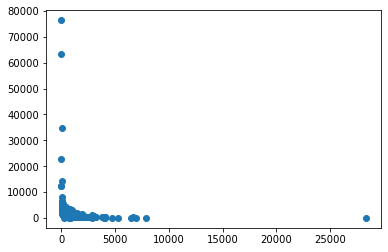

In [56]:
import matplotlib.pyplot as plt
plt.scatter(historical["area"],historical["price_m^2"])
plt.show()



In [57]:
historical = historical[historical["area"] < 10000]
historical = historical[historical["price_m^2"] < 10000]
historical.to_csv("historical.csv")

In [77]:
# plt.scatter(historical["area"],historical["price_m^2"])
# plt.show()

import altair as alt
alt.Chart(historical).mark_point().encode(
    alt.X("area:Q"),
    alt.Y ( "price_m^2:Q"),
    alt.Size("area"),
    tooltip= ["area","property_type","land/house"]
).interactive()

alt.Chart(...)

In [59]:
land_house = stat_price(['postcode',"land/house"],"price_m^2")
land_house

,,count,sum,min,mean,median,max,std/mean,skew
postcode,land/house,,,,,,,,
5072,apartment,6,203774.95,2350.00,33962.49,24633.22,76363.64,0.89,0.58
5073,apartment,4,18597.77,2405.06,4649.44,5079.12,6034.48,0.34,-1.48
5070,apartment,5,42683.87,3239.44,8536.77,5062.50,22916.67,0.97,1.96
5085,apartment,10,46983.08,2388.06,4698.31,4823.76,6708.86,0.31,-0.04
5074,apartment,4,18218.45,2837.84,4554.61,4536.46,6307.69,0.36,0.03
5087,apartment,9,30243.62,1648.35,3360.40,3416.67,4162.50,0.23,-1.41
5086,apartment,3,17857.44,2393.62,5952.48,3026.32,12437.50,0.94,1.71
5088,apartment,2,5553.33,2220.00,2776.66,2776.66,3333.33,0.28,NaN
5070,house,191,461665.98,901.64,2417.10,2300.75,5351.85,0.34,0.96


### **Trend**

Expolre following apsects in type-wise and postcode-wise 
- Mean/Median of the price;
- Mean/Median of the price per square.

*Note*: records selected after 2018

**Type-wise**

---

Filter conditions: 
- Only considered the records with area that under *400m^2*;
- Records selected after 2018

Conclusion:

- The most liquidity/volume types in the Adelaide property market by order are **3b2b**,**3b1b**,**2b1b** and **4b2b** respectively. Other types that remain are insignificant since lack of records.
    - **3b2b** and **3b1b** 
        - Trend. **3b1b**  have a flat between 2022 and 2023. On the other hand, **3b2b** drop 2.3% in 2023, even the interest rate and inflation is more higher than the previouse year(2022).
        - **3b2b** and **3b1b** have similar average area interval, which is 300 ± 10 m^2 , but have significant differnce of price/m^2: **3b2b** have greater 25% of price/m^2 than **3b1b**. (It's hard to tell that the extra bath will grow the house value due to the *3b3b* or above without sufficient data points)
        - 
    - **4b2b** 
        - Trend. 5% grow in 2023 compare to 2022.
        - **4b2b** had 13% higher of area than **3b2b** but had 17% higher of price/m^2 than **3b2b**
    - **4b3b**
        - From the limited records, **4b3b** had higher growing trend than **4b2b**.
        - With smilar average area with **4b2b** but had higher price/m^2 than **4b2b**'s. Same situation as that between 3b2b and 3b1b's
        

- Given a vacant land of 7000/m^2 to be developed, the median price, average area of **3b2b**'s **4b2b**'s and **2b1b**'s, the most valuable of type to develovp is **4b2b** and the least is **2b1b**(consider only single type of property to develop instead mix different types).



In [160]:
import altair as alt

alt.data_transformers.enable('default', max_rows=None)
alt.renderers.enable("html")
df = historical.loc[(historical["year"]>=2018)& (historical["land/house"] == "house")].copy()
df_type = df.loc[(df["property_type"].notna())]

average_type_trend = alt.Chart(df_type, title=alt.Title(
       "Average price of different type",
       subtitle="All type of property")).mark_line(point = True).encode(
    x = "year:O",
    y = "average(price):Q",
    color = "property_type:N",
    column = "property_type:N",
    tooltip = ["average(price)","year","count(year)","average(area)"],
    size="count(price)"
)

median_type_trend = alt.Chart(df_type, title=alt.Title(
       "Median price of different type",
       subtitle="All type of property")).mark_line(point = True).encode(
    x = "year:O",
    y = "median(price):Q",
    color = "property_type:N",
    column = "property_type:N",
    tooltip = ["median(price)","year","count(year)","average(area)"],size="count(price)"
)

average_type_trend & median_type_trend

alt.VConcatChart(...)

In [72]:
average_type_trend_price = alt.Chart(df_type,title=alt.Title(
       "Average of price/m^2",
       subtitle="All type of property")).mark_line(point = True).encode(
    alt.X("year:O"),
    alt.Y("average(price_m^2)",title="Mean of price/m^2"),
    alt.Color("property_type:N"),
    alt.Column("property_type:N"),
    tooltip = ["average(price_m^2)","year","count(year)","average(area)"],size="count(price)"
)

median_type_trend_price = alt.Chart(df_type,title=alt.Title(
       "Median of price/m^2",
       subtitle="All type of property")).mark_line(point = True).encode(
    alt.X("year:O"),
    alt.Y("median(price_m^2)",title="Mean of price/m^2"),
    alt.Color("property_type:N"),
    alt.Column("property_type:N"),
    tooltip = ["median(price_m^2)","year","count(year)","average(area)"],size="count(price)"
)
average_type_trend_price & median_type_trend_price

alt.VConcatChart(...)

**postcode-wise**

---
- Trend of average price/m^2 of **Aparment**:
    - Given the limited of records, it presented fluctuated.
    
- Trend of average price/m^2 of **Land**:
    - Downward shape present in **5070**, **5072** and **5087**
    - **5073**, **5075**,**5085** kept almost flat
    - **5074**,**5086** and **5088** have slight upward
- Trend of average price/m^2 of House:
    - **5070**,**5073**,**5074** and **5075** have significantly dropped compare to previouse year (9%~11% lower)
    - **5085** and **5088** have a upward shape(8%~11% higher than previouse year)

Conclusion:
- **5072** and **5085** may be are good choice to be developed, since where are growing the difference bewteen land cost and house cost



In [73]:
average_trend_postcode = alt.Chart(historical.loc[historical["year"]>=2018],title=alt.Title(
       "Average price of price/m^2",
       subtitle="Apartment/Land/House/Between")).mark_line(point = True).encode(
    alt.X("year:O"),
    alt.Y("average(price_m^2)",title="Mean of price"),
    alt.Color("land/house"),
    alt.Column("postcode:N"),
    tooltip = ["sum(price)","average(price_m^2)","year","count(year)","average(area)"],size="count(price)"
)

median_trend_postcode = alt.Chart(historical.loc[historical["year"]>=2018],title=alt.Title(
       "Median price of price/m^2",
       subtitle="Land/House/Between")).mark_line(point = True).encode(
    alt.X("year:O"),
    alt.Y("median(price_m^2)",title="Mean of price"),
    alt.Color("land/house"),
    alt.Column("postcode:N"),
    tooltip = ["sum(price)","median(price_m^2)","year","count(year)","average(area)"],size="count(price)"
)


average_trend_postcode & median_trend_postcode

alt.VConcatChart(...)

### **The largest difference between cost of land and sale of house**


Creat a new dataframe which contains the cost of land and cost of house(eg, price/m^2) in postcode-wise and suburd-wise. Also, the count of records reflect the countable of the result.

---

Note: the return calculated by  $(house cost_{avg} - land cost_{avg})/house cost_{avg} *100$

In [122]:
land_cost = historical.loc[historical["land/house"]=="land"].groupby(["postcode","suburb"]).agg(avg_land_cost=("price_m^2","mean"),land_record_count = ("price_m^2","count"))
house_cost = historical.loc[historical["land/house"]=="house"].groupby(["postcode","suburb"]).agg(avg_house_cost=("price_m^2","mean"),house_record_count = ("price_m^2","count"))
apartment_cost = historical.loc[historical["land/house"]=="apartment"].groupby(["postcode","suburb"]).agg(avg_apartment_cost=("price_m^2","mean"),apartment_record_count = ("price_m^2","count"))
return_ratio = land_cost.merge(house_cost,how = "left",on=["postcode","suburb"])
return_ratio = return_ratio.merge(apartment_cost,how = "left",on =["postcode","suburb"])
return_ratio["return of house %"] = (return_ratio["avg_house_cost"] - return_ratio["avg_land_cost"])/return_ratio["avg_house_cost"] * 100
return_ratio["return of apartment %"] = (return_ratio["avg_apartment_cost"] - return_ratio["avg_land_cost"])/return_ratio["avg_apartment_cost"] * 100
for i in return_ratio.columns:
    return_ratio[i] = round(return_ratio[i],2)
return_ratio.sort_values(["return of house %","return of apartment %"],ascending= False)

avg_land_cost  land_record_count  avg_house_cost  \
postcode suburb                                                                
5072     TERINGIE                  490.47                 35         2163.80   
         WOODFORDE                 890.46                 20         2488.37   
5074     CAMPBELLTOWN              974.41                100         2355.20   
5075     DERNANCOURT               740.71                101         1720.63   
5070     MARDEN                   1230.97                 15         2827.34   
5073     HECTORVILLE              1035.36                 42         2372.58   
5070     PAYNEHAM                 1101.97                 17         2434.24   
         GLYNDE                    995.29                 23         2179.27   
5088     HOLDEN HILL               594.92                102         1282.65   
5070     FELIXSTOW                1074.47                 34         2284.72   
5074     NEWTON                   1014.49                 38         2136.03   
5075     PARADISE                  853.04                117         1793.64   
5070     PAYNEHAM SOUTH           1196.74                 17         2493.14   
5086     GILLES PLAINS             773.10                 16         1596.49   
5087     KLEMZIG                   919.00                 79         1858.00   
5072     MAGILL                   1074.42                128         2162.96   
5087     WINDSOR GARDENS           760.21                 80         1498.26   
5085     NORTHFIELD                842.29                 35         1617.99   
5073     ROSTREVOR                1084.81                112         2048.04   
5085     ENFIELD                   877.63                 45         1651.43   
5086     HAMPSTEAD GARDENS         868.12                 18         1626.02   
5085     CLEARVIEW                 839.11                 46         1561.88   
5070     FIRLE                    1243.44                 17         2280.42   
5085     LIGHTSVIEW               1865.38                  2         3288.83   
5073     TRANMERE                 1246.36                 50         2137.61   
5086     HILLCREST                 842.50                 20         1439.55   
5070     JOSLIN                   1713.12                 32         2889.45   
5086     GREENACRES                850.97                 35         1432.81   
5085     NORTHGATE                1273.30                  2         2047.87   
5086     OAKDEN                   1089.06                  5         1723.23   
5072     ROSSLYN PARK             1396.95                 34         2012.58   
5070     ROYSTON PARK             1692.63                 34         2208.24   
5086     MANNINGHAM               1154.16                 40         1250.00   
5072     AULDANA                   965.72                 30             NaN   
         SKYE                      580.81                 10             NaN   

                            house_record_count  avg_apartment_cost  \
postcode suburb                                                      
5072     TERINGIE                          7.0                 NaN   
         WOODFORDE                         6.0                 NaN   
5074     CAMPBELLTOWN                    188.0             4215.18   
5075     DERNANCOURT                      64.0                 NaN   
5070     MARDEN                           31.0             5062.50   
5073     HECTORVILLE                      73.0             6034.48   
5070     PAYNEHAM                         46.0                 NaN   
         GLYNDE                           27.0                 NaN   
5088     HOLDEN HILL                     147.0             2776.66   
5070     FELIXSTOW                        38.0                 NaN   
5074     NEWTON                           83.0             5572.92   
5075     PARADISE                        126.0                 NaN   
5070     PAYNEHAM SOUTH                   21.0             5611.38   
5086     GILLES P

In [158]:
rank_return_house = alt.Chart(return_ratio.reset_index(),title = "Rank of house return").mark_bar(color="#FF4500").encode(
    alt.X("return of house %:Q"),
    alt.Y("suburb:N",sort="-x"),
    alt.Size("house_record_count"),#,alt.Color("postcode:N")
    tooltip = ["postcode","avg_land_cost","land_record_count","avg_house_cost","house_record_count","return of house %"]
)

rank_return_apartment = alt.Chart(return_ratio.reset_index(),title = "Rank of aparment return").mark_bar(color="#FF4500").encode(
    alt.X("return of apartment %:Q"),
    alt.Y("suburb:N",sort="-x"),
    alt.Size("apartment_record_count"),#,alt.Color("postcode:N")
    tooltip = ["postcode","avg_land_cost","land_record_count","avg_apartment_cost","apartment_record_count","return of house %"]
)
rank_return_apartment.interactive() | rank_return_house.interactive()
 

alt.HConcatChart(...)

### **Agent performance**

---

Land and house wise

In [63]:
agent_land = alt.Chart(historical.loc[(historical["year"]>2018) & (historical["agent_name"].notnull()) & (historical["land/house"]=="land")],title="Land agent").mark_bar().encode(
    alt.X("sum(price):Q",title="Sum of sales"),
    alt.Y("agent_name:N",sort=alt.EncodingSortField(
        op = "sum",
        field = "price",
        order = "descending"
    )),
    alt.Size("average(price_m^2)"),
    tooltip = ["count(price)","sum(price)","median(price_m^2)"]
)

agent_house = alt.Chart(historical.loc[(historical["year"]>2018) & (historical["agent_name"].notnull())\
                                       & (historical["land/house"]=="house")],title = "House Agent").mark_bar()\
    .encode(
    alt.X("sum(price):Q",title="Sum of sales"),
    alt.Y("agent_name:N",sort=alt.EncodingSortField(
        op = "sum",
        field = "price",
        order = "descending"
    )),
    alt.Size("average(price_m^2)"),
    tooltip = ["count(price)","sum(price)","median(price_m^2)"]
)
agent_land | agent_house


alt.HConcatChart(...)

---

Type wsie

In [64]:
agent_type_2b1b = alt.Chart(historical.loc[(historical["year"]>2018) & (historical["agent_name"].notnull()) & (historical["land/house"]=="land") & (historical["property_type"]=="2b1b")],\
                            title="Agent of type performance").mark_bar().encode(
    alt.X("sum(price):Q",title="Sum of sales"),
    alt.Y("agent_name:N",sort=alt.EncodingSortField(
        op = "sum",
        field = "price",
        order = "descending"
    )),
    alt.Size("average(price_m^2)"),
    alt.Column("property_type"),
    tooltip = ["count(price)","sum(price)","median(price_m^2)"] 
)

agent_type_3b1b = alt.Chart(historical.loc[(historical["year"]>2018) & (historical["agent_name"].notnull()) & (historical["land/house"]=="land") & (historical["property_type"]=="3b1b")],title="Agent of type performance").mark_bar().encode(
    alt.X("sum(price):Q",title="Sum of sales"),
    alt.Y("agent_name:N",sort=alt.EncodingSortField(
        op = "sum",
        field = "price",
        order = "descending"
    )),
    alt.Size("average(price_m^2)"),
    alt.Column("property_type"),
    tooltip = ["count(price)","sum(price)","median(price_m^2)"] 
)

agent_type_3b2b = alt.Chart(historical.loc[(historical["year"]>2018) & (historical["agent_name"].notnull()) & (historical["land/house"]=="land") & (historical["property_type"]=="3b2b")],title="Agent of type performance").mark_bar().encode(
    alt.X("sum(price):Q",title="Sum of sales"),
    alt.Y("agent_name:N",sort=alt.EncodingSortField(
        op = "sum",
        field = "price",
        order = "descending"
    )),
    alt.Size("average(price_m^2)"),
    alt.Column("property_type"),
    tooltip = ["count(price)","sum(price)","median(price_m^2)"] 
)

agent_type_4b2b = alt.Chart(historical.loc[(historical["year"]>2018) & (historical["agent_name"].notnull()) & (historical["land/house"]=="land") & (historical["property_type"]=="4b2b")],title="Agent of type performance").mark_bar().encode(
    alt.X("sum(price):Q",title="Sum of sales"),
    alt.Y("agent_name:N",sort=alt.EncodingSortField(
        op = "sum",
        field = "price",
        order = "descending"
    )),
    alt.Size("average(price_m^2)"),
    alt.Column("property_type"),
    tooltip = ["count(price)","sum(price)","median(price_m^2)"] 
)
agent_type_2b1b | agent_type_3b1b | agent_type_3b2b |agent_type_4b2b

alt.HConcatChart(...)

## Rental data

To be analysis

In [65]:

zip_list = [5072,5073,5074,5075,5085,5086,5087,5088]
rent  = pd.read_csv("C:/Users/iamUl/Desktop/intern/data/data-analysis-main/Data/For Rent/rent-5070.csv")
total_rent = rent.copy()
for i in zip_list:
    path = "C:/Users/iamUl/Desktop/intern/data/data-analysis-main/Data/For Rent/rent-" + str(i) + ".csv"
    tem = pd.read_csv(path)
    total_rent = total_rent.append(tem)
total_rent = total_rent.reset_index(drop=True)
total_rent.shape
total_rent.head(10)

C:\Users\iamUl\AppData\Local\Temp\ipykernel_32848\1472590869.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_rent = total_rent.append(tem)
C:\Users\iamUl\AppData\Local\Temp\ipykernel_32848\1472590869.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_rent = total_rent.append(tem)
C:\Users\iamUl\AppData\Local\Temp\ipykernel_32848\1472590869.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_rent = total_rent.append(tem)
C:\Users\iamUl\AppData\Local\Temp\ipykernel_32848\1472590869.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_rent = total_rent.append(tem)
C:\Users\iamUl\AppData\Local\Temp\ipykernel_3284

,area,baths,beds,parking,date,main_img,price,address,property_type,agent_name,company_name,logo,maps,check_date,auction_date,school_list,url,village_name,DOMAINSAYS,number
0,−,1,3,3,Organise an inspection,https://rimh2.domainstatic.com.au/AkKnAILLkFsl...,$620 per week,2a Payne Street Payneham SA 5070,NaN,Paige Rosser,Ouwens Casserly Property Management (RLA 223245),NaN,"-34.8990012,138.6410786",NaN,NaN,"[{""school_name"": ""Trinity Gardens School"", ""sc...",https://www.domain.com.au/2a-payne-street-payn...,PAYNEHAM,"First listed on 3 May, this house has been on ...",5070
1,NaN,1,3,2,"Tuesday, 4:45pm",https://rimh2.domainstatic.com.au/LKhpEswk93Wc...,$520 - $545 / Wk Neg,87 Arthur Street Payneham South SA 5070,NaN,Matthew Panozzo,LJ Hooker Adelaide Metro,NaN,"-34.9041688,138.6430388","Tuesday, 9 May ;4:45pm - 5:00pm",NaN,"[{""school_name"": ""Trinity Gardens School"", ""sc...",https://www.domain.com.au/87-arthur-street-pay...,PAYNEHAM SOUTH,"First listed on 5 May, this house has been on ...",5070
2,−,1,2,1,Organise an inspection,https://rimh2.domainstatic.com.au/HtQGI4ytc0V3...,$400 pw,7/4 Fisher Street Felixstow SA 5070,NaN,Mersida Becirovic,Magain Real Estate Adelaide,NaN,"-34.8915982,138.6463342",NaN,NaN,"[{""school_name"": ""East Marden Primary School"",...",https://www.domain.com.au/7-4-fisher-street-fe...,FELIXSTOW,"First listed on 26 April, this house has been ...",5070
3,NaN,1,2,2,"Wednesday, 4:15pm",https://rimh2.domainstatic.com.au/XndvUW_ZVCTo...,$440,6/24 Broad Street Marden SA 5070,NaN,John Capoccia,Real Estate Partners SA - RLA 63916,NaN,"-34.895085,138.6356668","Wednesday, 10 May ;4:15pm - 4:40pm",NaN,"[{""school_name"": ""East Adelaide School"", ""scho...",https://www.domain.com.au/6-24-broad-street-ma...,MARDEN,"First listed on 27 April, this house has been ...",5070
4,−,2,3,2,Organise an inspection,https://rimh2.domainstatic.com.au/mmJywMDjog3p...,$500,130 Gage Street Firle SA 5070,NaN,Nathan DeRuiter,Lin Andrews Real Estate,NaN,"-34.903048,138.6508455",NaN,NaN,"[{""school_name"": ""Trinity Gardens School"", ""sc...",https://www.domain.com.au/130-gage-street-firl...,FIRLE,"130 Gage Street, Firle SA 5070 was last sold i...",5070
5,−,1,2,2,Organise an inspection,https://rimh2.domainstatic.com.au/b_eWmNqyuisQ...,$480,11 Ashleigh Ave Felixstow SA 5070,NaN,Easy Sell Rent,Easy Sell Rent,NaN,"-34.8906564,138.649481",NaN,NaN,"[{""school_name"": ""East Marden Primary School"",...",https://www.domain.com.au/11-ashleigh-ave-feli...,FELIXSTOW,"First listed on 27 April, this house has been ...",5070
6,12.48m²,1,2,1,Organise an inspection,https://rimh2.domainstatic.com.au/rg3AhciG-YWs...,$470,18/1 Alexander Lane Marden SA 5070,NaN,Alex Pearse,Ray White West Torrens,NaN,"-34.89271650000001,138.6287336",NaN,NaN,"[{""school_name"": ""Vale Park Primary School"", ""...",https://www.domain.com.au/18-1-alexander-lane-...,MARDEN,"First listed on 27 April, this house has been ...",5070
7,129m²,1,3,2,"Tuesday, 4:30pm",https://rimh2.domainstatic.com.au/OSMrRK5MKhda...,$600.00 pw,30/22 Broad Street Marden SA 5070,NaN,Debra Selth,Harcourts Sergeant,NaN,"-34.8955242,138.6357291","Tuesday, 9 May ;4:30pm - 5:00pm",NaN,"[{""school_name"": ""East Adelaide School"", ""scho...",https://www.domain.com.au/30-22-broad-street-m...,MARDEN,"First listed on 1 May, this unit has been on D...",5070
8,NaN,1,2,1,Organise an inspection,https://rimh2.domainstatic.com.au/dgJRtn9r_x6L...,$425 weekly,2/59 Ashbrook Avenue Payneham SA 5070,NaN,Alex Gangnuzs,Harris Real Estate - RLA 226409,NaN,"-34.9011101,138.6451518",NaN,NaN,"[{""school_name"": ""Trinity Gardens School"", ""sc...",https://www.domain.com.au/2-59-ashbrook-avenue...,PAYNEHAM,"First listed on 4 May, this unit has been on D...",5070
9,−,2,2,1,Organise an inspection,https://rimh2.domainstatic.com.au/f4Xeo-yBaNQv...,$550.00 Per Week,4/116 Second Avenue Royston Park SA 5070,NaN,Gabrielle Overton,LJ Hooker Kensington | Unley,NaN,"-34.8999994,138.6318068",NaN,NaN,"[{""school_name"": ""East Adelaide Sch